In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from tensorflow import keras
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Convolution2D, MaxPooling2D, Dropout, Flatten, Dense, Conv2D
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from imgaug import augmenters as iaa
import cv2
import pandas as pd
import ntpath
import random

In [ ]:
#downloading data
!git clone https://github.com/Muhannad-Khaled/Self-Driving-Car

Cloning into 'Self-Driving-Car'...
remote: Enumerating objects: 14837, done.
remote: Counting objects: 100% (3/3), done.
remote: Total 14837 (delta 0), reused 3 (delta 0), pack-reused 14834
Receiving objects: 100% (14837/14837), 216.65 MiB | 36.92 MiB/s, done.
Updating files: 100% (14831/14831), done.


In [ ]:
# Downloading data
!git clone https://github.com/Muhannad-Khaled/Self-Driving-Car

datadir = 'Self-Driving-Car/data'
columns = ['center', 'left', 'right', 'steering', 'throttle', 'reverse', 'speed']
data = pd.read_csv(os.path.join(datadir, 'driving_log.csv'), names = columns)
pd.set_option('display.max_colwidth', None) # Set to None to use default width
data.head()

fatal: destination path 'Self-Driving-Car' already exists and is not an empty directory.


,center,left,right,steering,throttle,reverse,speed
0,D:\My Learning\College Material\Training\Internal\simulator-windows-64\data\IMG\center_2024_06_24_22_08_32_226.jpg,D:\My Learning\College Material\Training\Internal\simulator-windows-64\data\IMG\left_2024_06_24_22_08_32_226.jpg,D:\My Learning\College Material\Training\Internal\simulator-windows-64\data\IMG\right_2024_06_24_22_08_32_226.jpg,0.0,0.0,0.0,0.000078
1,D:\My Learning\College Material\Training\Internal\simulator-windows-64\data\IMG\center_2024_06_24_22_08_32_331.jpg,D:\My Learning\College Material\Training\Internal\simulator-windows-64\data\IMG\left_2024_06_24_22_08_32_331.jpg,D:\My Learning\College Material\Training\Internal\simulator-windows-64\data\IMG\right_2024_06_24_22_08_32_331.jpg,0.0,0.0,0.0,0.000078
2,D:\My Learning\College Material\Training\Internal\simulator-windows-64\data\IMG\center_2024_06_24_22_08_32_443.jpg,D:\My Learning\College Material\Training\Internal\simulator-windows-64\data\IMG\left_2024_06_24_22_08_32_443.jpg,D:\My Learning\College Material\Training\Internal\simulator-windows-64\data\IMG\right_2024_06_24_22_08_32_443.jpg,0.0,0.0,0.0,0.000078
3,D:\My Learning\College Material\Training\Internal\simulator-windows-64\data\IMG\center_2024_06_24_22_08_32_554.jpg,D:\My Learning\College Material\Training\Internal\simulator-windows-64\data\IMG\left_2024_06_24_22_08_32_554.jpg,D:\My Learning\College Material\Training\Internal\simulator-windows-64\data\IMG\right_2024_06_24_22_08_32_554.jpg,0.0,0.0,0.0,0.000078
4,D:\My Learning\College Material\Training\Internal\simulator-windows-64\data\IMG\center_2024_06_24_22_08_32_660.jpg,D:\My Learning\College Material\Training\Internal\simulator-windows-64\data\IMG\left_2024_06_24_22_08_32_660.jpg,D:\My Learning\College Material\Training\Internal\simulator-windows-64\data\IMG\right_2024_06_24_22_08_32_660.jpg,0.0,0.0,0.0,0.000079


In [ ]:
def path_leaf(path):
  head, tail = ntpath.split(path)
  return tail
data['center'] = data['center'].apply(path_leaf)
data['left'] = data['left'].apply(path_leaf)
data['right'] = data['right'].apply(path_leaf)
data.head()

,center,left,right,steering,throttle,reverse,speed
0,center_2024_06_24_22_08_32_226.jpg,left_2024_06_24_22_08_32_226.jpg,right_2024_06_24_22_08_32_226.jpg,0.0,0.0,0.0,0.000078
1,center_2024_06_24_22_08_32_331.jpg,left_2024_06_24_22_08_32_331.jpg,right_2024_06_24_22_08_32_331.jpg,0.0,0.0,0.0,0.000078
2,center_2024_06_24_22_08_32_443.jpg,left_2024_06_24_22_08_32_443.jpg,right_2024_06_24_22_08_32_443.jpg,0.0,0.0,0.0,0.000078
3,center_2024_06_24_22_08_32_554.jpg,left_2024_06_24_22_08_32_554.jpg,right_2024_06_24_22_08_32_554.jpg,0.0,0.0,0.0,0.000078
4,center_2024_06_24_22_08_32_660.jpg,left_2024_06_24_22_08_32_660.jpg,right_2024_06_24_22_08_32_660.jpg,0.0,0.0,0.0,0.000079


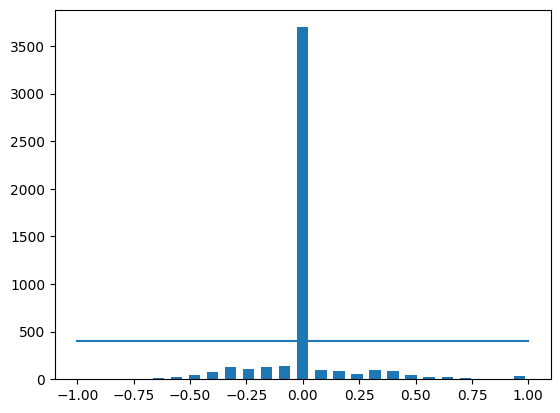

In [ ]:
num_bins = 25
samples_per_bin = 400
hist, bins = np.histogram(data['steering'], num_bins)
center = (bins[:-1]+ bins[1:]) * 0.5
plt.bar(center, hist, width=0.05)
plt.plot((np.min(data['steering']), np.max(data['steering'])), (samples_per_bin, samples_per_bin))

In [ ]:
print('total data:', len(data))
print(data.shape)

total data: 4943
(4943, 7)


In [ ]:
remove_list = []
for j in range(num_bins):
  list_ = []
  for i in range(len(data['steering'])):
    if data['steering'][i] >= bins[j] and data['steering'][i] <= bins[j+1]:
      list_.append(i)
  list_ = shuffle(list_)
  list_ = list_[samples_per_bin:]
  remove_list.extend(list_)

print('removed:', len(remove_list))
data.drop(data.index[remove_list], inplace=True)
print('remaining:', len(data))

removed: 3297
remaining: 1646


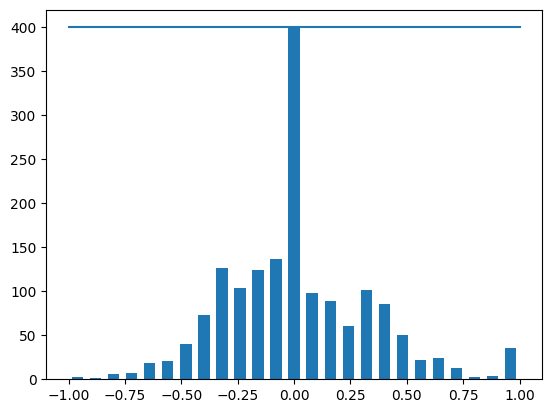

In [ ]:
hist, _ = np.histogram(data['steering'], (num_bins))
plt.bar(center, hist, width=0.05)
plt.plot((np.min(data['steering']), np.max(data['steering'])), (samples_per_bin, samples_per_bin))

In [ ]:
def load_img_steering(datadir, df):
  image_path = []
  steering = []
  for i in range(len(data)):
    indexed_data = data.iloc[i]
    center, left, right = indexed_data[0], indexed_data[1], indexed_data[2]
    image_path.append(os.path.join(datadir, center.strip()))
    steering.append(float(indexed_data[3]))
    # left image append
    image_path.append(os.path.join(datadir,left.strip()))
    steering.append(float(indexed_data[3])+0.15)
    # right image append
    image_path.append(os.path.join(datadir,right.strip()))
    steering.append(float(indexed_data[3])-0.15)
  image_paths = np.asarray(image_path)
  steerings = np.asarray(steering)
  return image_paths, steerings

In [ ]:
image_paths, steerings = load_img_steering(datadir + '/IMG', data)
X_train, X_valid, y_train, y_valid = train_test_split(image_paths, steerings, test_size=0.2, random_state=6)
print('Training Samples: {}\nValid Samples: {}'.format(len(X_train), len(X_valid)))

Training Samples: 3950
Valid Samples: 988


In [ ]:
image_paths[0]

'Self-Driving-Car/data/IMG/center_2024_06_24_22_08_32_660.jpg'

In [ ]:
steerings[0]

0.0

Text(0.5, 1.0, 'Validation set')

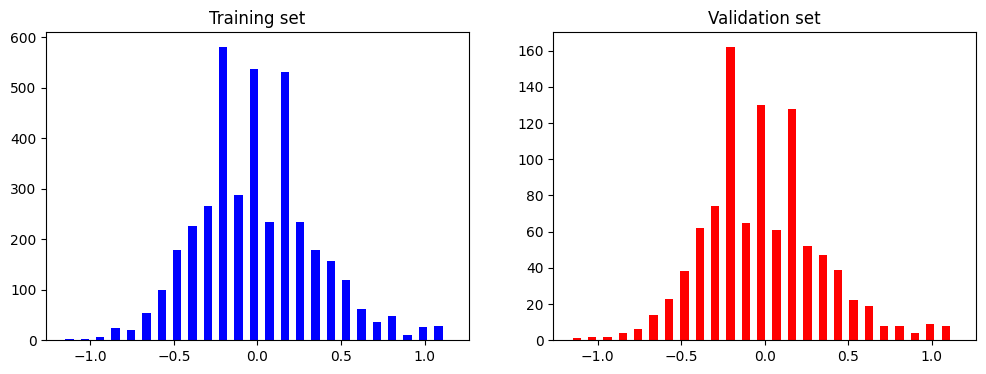

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
axes[0].hist(y_train, bins=num_bins, width=0.05, color='blue')
axes[0].set_title('Training set')
axes[1].hist(y_valid, bins=num_bins, width=0.05, color='red')
axes[1].set_title('Validation set')

Text(0.5, 1.0, 'Zoomed Image')

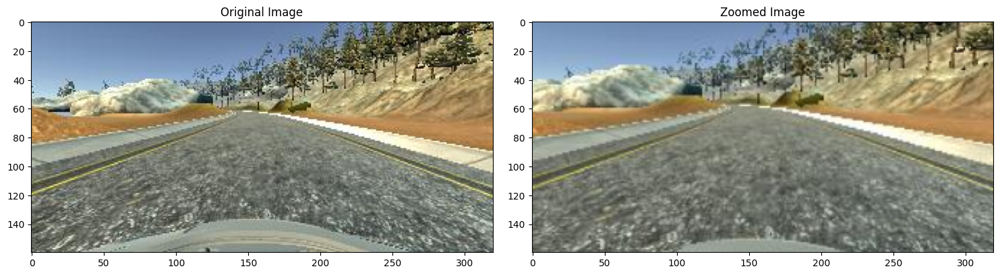

In [ ]:
def zoom(image):
  zoom = iaa.Affine(scale=(1, 1.3))
  image = zoom.augment_image(image)
  return image
image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
zoomed_image = zoom(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(zoomed_image)
axs[1].set_title('Zoomed Image')

Text(0.5, 1.0, 'Panned Image')

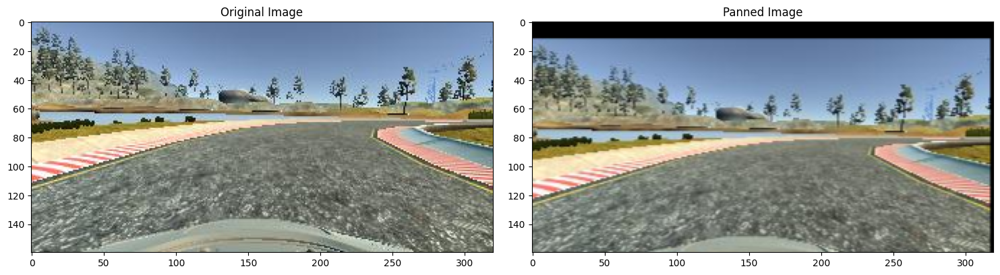

In [ ]:
def pan(image):
  pan = iaa.Affine(translate_percent= {"x" : (-0.1, 0.1), "y": (-0.1, 0.1)})
  image = pan.augment_image(image)
  return image
image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
panned_image = pan(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(panned_image)
axs[1].set_title('Panned Image')

Text(0.5, 1.0, 'Brightness altered image ')

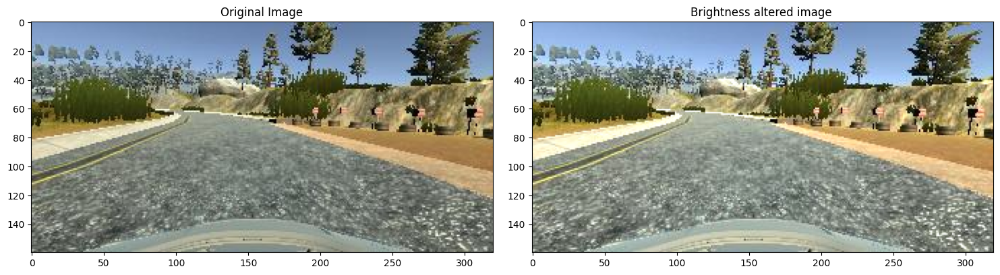

In [ ]:
def img_random_brightness(image):
    brightness = iaa.Multiply((0.2, 1.2))
    image = brightness.augment_image(image)
    return image
image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
brightness_altered_image = img_random_brightness(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(brightness_altered_image)
axs[1].set_title('Brightness altered image ')

Text(0.5, 1.0, 'Flipped Image - Steering Angle:0.4050435')

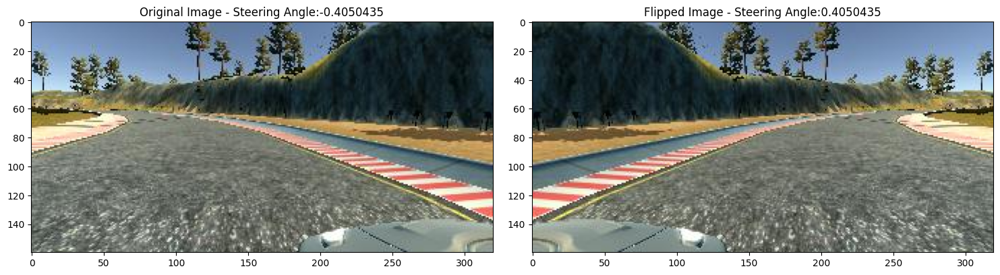

In [ ]:
def img_random_flip(image, steering_angle):
    image = cv2.flip(image,1)
    steering_angle = -steering_angle
    return image, steering_angle
random_index = random.randint(0, 1000)
image = image_paths[random_index]
steering_angle = steerings[random_index]


original_image = mpimg.imread(image)
flipped_image, flipped_steering_angle = img_random_flip(original_image, steering_angle)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image - ' + 'Steering Angle:' + str(steering_angle))

axs[1].imshow(flipped_image)
axs[1].set_title('Flipped Image - ' + 'Steering Angle:' + str(flipped_steering_angle))

In [ ]:
def random_augment(image, steering_angle):
    image = mpimg.imread(image)
    if np.random.rand() < 0.5:
      image = pan(image)
    if np.random.rand() < 0.5:
      image = zoom(image)
    if np.random.rand() < 0.5:
      image = img_random_brightness(image)
    if np.random.rand() < 0.5:
      image, steering_angle = img_random_flip(image, steering_angle)

    return image, steering_angle

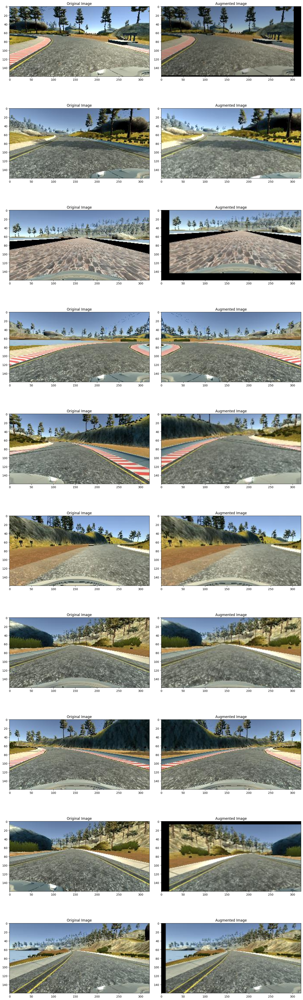

In [ ]:
ncol = 2
nrow = 10

fig, axs = plt.subplots(nrow, ncol, figsize=(15, 50))
fig.tight_layout()

for i in range(10):
  randnum = random.randint(0, len(image_paths) - 1)
  random_image = image_paths[randnum]
  random_steering = steerings[randnum]

  original_image = mpimg.imread(random_image)
  augmented_image, steering = random_augment(random_image, random_steering)

  axs[i][0].imshow(original_image)
  axs[i][0].set_title("Original Image")

  axs[i][1].imshow(augmented_image)
  axs[i][1].set_title("Augmented Image")

In [ ]:
def img_preprocess(img):
    img = img[60:135,:,:]
    img = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
    img = cv2.GaussianBlur(img,  (3, 3), 0)
    img = cv2.resize(img, (200, 66))
    img = img/255
    return img

Text(0.5, 1.0, 'Preprocessed Image')

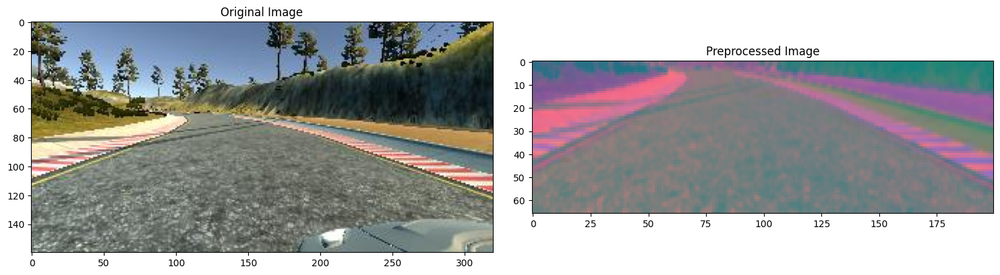

In [ ]:
image = image_paths[100]
original_image = mpimg.imread(image)
preprocessed_image = img_preprocess(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
axs[0].imshow(original_image)
axs[0].set_title('Original Image')
axs[1].imshow(preprocessed_image)
axs[1].set_title('Preprocessed Image')


In [ ]:
def batch_generator(image_paths, steering_ang, batch_size, istraining):

  while True:
    batch_img = []
    batch_steering = []

    for i in range(batch_size):
      random_index = random.randint(0, len(image_paths) - 1)

      if istraining:
        im, steering = random_augment(image_paths[random_index], steering_ang[random_index])

      else:
        im = mpimg.imread(image_paths[random_index])
        steering = steering_ang[random_index]

      im = img_preprocess(im)
      batch_img.append(im)
      batch_steering.append(steering)
    yield (np.asarray(batch_img), np.asarray(batch_steering))
x_train_gen, y_train_gen = next(batch_generator(X_train, y_train, 1, 1))
x_valid_gen, y_valid_gen = next(batch_generator(X_valid, y_valid, 1, 0))

Text(0.5, 1.0, 'Validation Image')

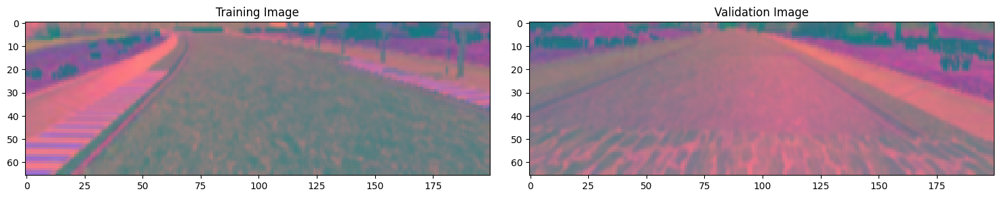

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(x_train_gen[0])
axs[0].set_title('Training Image')

axs[1].imshow(x_valid_gen[0])
axs[1].set_title('Validation Image')

In [ ]:
def nvidia_model():
  model = Sequential()
  model.add(Conv2D(24, (5, 5), strides=(2, 2), input_shape=(66, 200, 3), activation='elu'))
  model.add(Conv2D(36, (5, 5), strides=(2, 2), activation='elu'))
  model.add(Conv2D(48, (5, 5), strides=(2, 2), activation='elu'))
  model.add(Conv2D(64, (5, 5), activation='elu'))
  # model.add(Conv2D(64, (3,3), activation='elu'))
#   model.add(Dropout(0.5))


  model.add(Flatten())

  model.add(Dense(100, activation = 'elu'))
#   model.add(Dropout(0.5))

  model.add(Dense(50, activation = 'elu'))
#   model.add(Dropout(0.5))

  model.add(Dense(10, activation = 'elu'))
#   model.add(Dropout(0.5))

  model.add(Dense(1))

  optimizer = tf.keras.optimizers.Adam(learning_rate=1e-3)
  model.compile(loss='mse', optimizer=optimizer)
  return model

model = nvidia_model()
print(model.summary())

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 31, 98, 24)        1824      
                                                                 
 conv2d_1 (Conv2D)           (None, 14, 47, 36)        21636     
                                                                 
 conv2d_2 (Conv2D)           (None, 5, 22, 48)         43248     
                                                                 
 conv2d_3 (Conv2D)           (None, 1, 18, 64)         76864     
                                                                 
 flatten (Flatten)           (None, 1152)              0         
                                                                 
 dense (Dense)               (None, 100)               115300    
                                                                 
 dense_1 (Dense)             (None, 50)                5

In [ ]:
history = model.fit_generator(batch_generator(X_train, y_train, 100, 1),
                                  steps_per_epoch=300,
                                  epochs=10,
                                  validation_data=batch_generator(X_valid, y_valid, 100, 0),
                                  validation_steps=200,
                                  verbose=1,
                                  shuffle = 1)

<ipython-input-44-c6c3380b9281>:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(batch_generator(X_train, y_train, 100, 1),


Epoch 1/10
300/300 [==============================] - 150s 474ms/step - loss: 0.1089 - val_loss: 0.0756
Epoch 2/10
300/300 [==============================] - 139s 465ms/step - loss: 0.0782 - val_loss: 0.0656
Epoch 3/10
300/300 [==============================] - 129s 430ms/step - loss: 0.0706 - val_loss: 0.0557
Epoch 4/10
300/300 [==============================] - 143s 477ms/step - loss: 0.0641 - val_loss: 0.0691
Epoch 5/10
300/300 [==============================] - 132s 441ms/step - loss: 0.0595 - val_loss: 0.0549
Epoch 6/10
300/300 [==============================] - 169s 565ms/step - loss: 0.0561 - val_loss: 0.0526
Epoch 7/10
300/300 [==============================] - 158s 528ms/step - loss: 0.0523 - val_loss: 0.0427
Epoch 8/10
300/300 [==============================] - 159s 532ms/step - loss: 0.0528 - val_loss: 0.0424
Epoch 9/10
300/300 [==============================] - 159s 530ms/step - loss: 0.0512 - val_loss: 0.0457
Epoch 10/10
300/300 [==============================] - 122s 408m

Text(0.5, 0, 'Epoch')

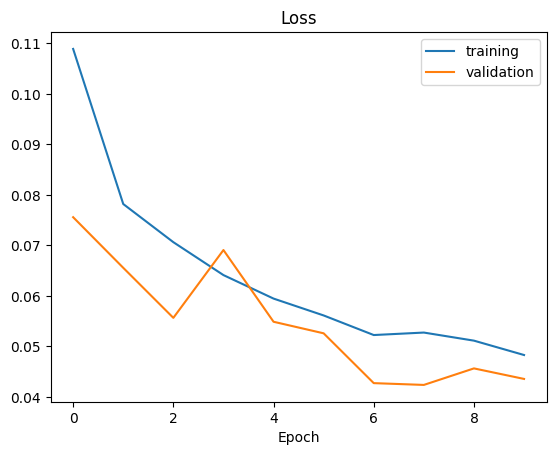

In [ ]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['training', 'validation'])
plt.title('Loss')
plt.xlabel('Epoch')

In [ ]:
model.save('model.h5')
from google.colab import files
files.download('model.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>